In [ ]:
!pip install opendatasets --upgrade --quiet

In [ ]:
import opendatasets as od

In [ ]:
dataset_url = 'https://www.kaggle.com/ikarus777/best-artworks-of-all-time'

In [ ]:
od.download(dataset_url)

  0%|          | 0.00/2.29G [00:00<?, ?B/s]

100%|██████████| 2.29G/2.29G [00:36<00:00, 67.9MB/s]


In [ ]:
data_dir = '/content/best-artworks-of-all-time/resized/'

In [ ]:
import os

In [ ]:
for cls in os.listdir(data_dir):
  print(cls, ':', len(os.listdir(data_dir + '/' + cls)))

resized : 8683


In [ ]:
from torchvision.datasets import ImageFolder

In [ ]:
dataset = ImageFolder(data_dir)

In [ ]:
len(dataset)

8683

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

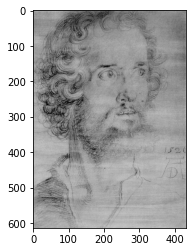

In [ ]:
img, label = dataset[0]
plt.imshow(img)

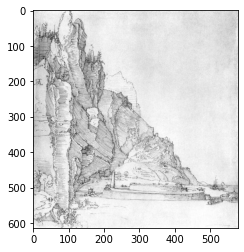

In [ ]:
img, label = dataset[500]
plt.imshow(img)

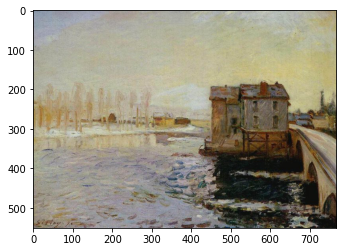

In [ ]:
img, label = dataset[741]
plt.imshow(img)

In [ ]:
import torchvision.transforms as tt
from torch.utils.data import DataLoader

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(data_dir, transform=tt.Compose([
    tt.Resize(image_size),
    tt.CenterCrop(image_size),
    tt.ToTensor(),
    tt.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
from torchvision.utils import make_grid

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


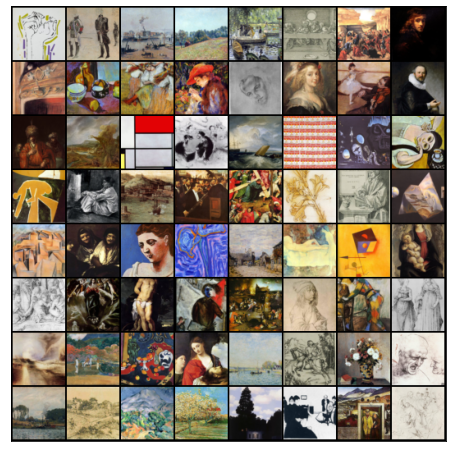

In [ ]:
show_batch(train_dl)

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
import torch

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


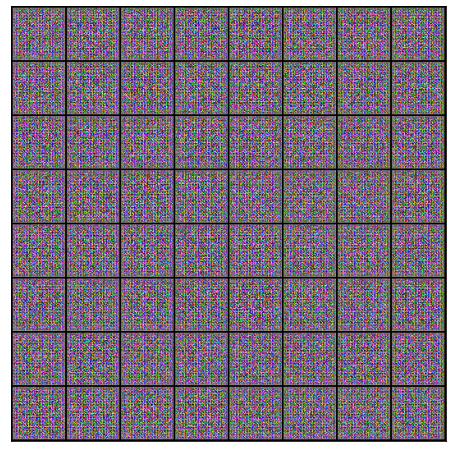

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


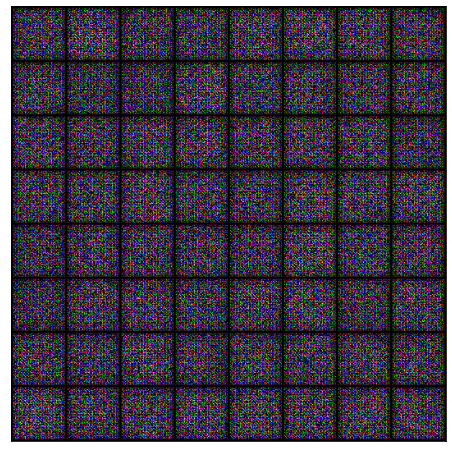

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 300

In [ ]:
history = fit(epochs, lr)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))



Epoch [1/300], loss_g: 8.7825, loss_d: 0.7904, real_score: 0.9316, fake_score: 0.4317
Saving generated-images-0001.png



Epoch [2/300], loss_g: 3.4211, loss_d: 0.2709, real_score: 0.8479, fake_score: 0.0866
Saving generated-images-0002.png



Epoch [3/300], loss_g: 2.4730, loss_d: 0.6031, real_score: 0.6400, fake_score: 0.0274
Saving generated-images-0003.png



Epoch [4/300], loss_g: 4.1365, loss_d: 0.7612, real_score: 0.7983, fake_score: 0.3907
Saving generated-images-0004.png



Epoch [5/300], loss_g: 1.9669, loss_d: 0.5368, real_score: 0.6597, fake_score: 0.0576
Saving generated-images-0005.png



Epoch [6/300], loss_g: 6.2622, loss_d: 4.5370, real_score: 0.1312, fake_score: 0.0001
Saving generated-images-0006.png



Epoch [7/300], loss_g: 3.6734, loss_d: 0.3283, real_score: 0.7871, fake_score: 0.0588
Saving generated-images-0007.png



Epoch [8/300], loss_g: 4.8775, loss_d: 0.5916, real_score: 0.8569, fake_score: 0.3191
Saving generated-images-0008.png



Epoch [9/300], loss_g: 1.8112, loss_d: 1.2102, real_score: 0.3889, fake_score: 0.0523
Saving generated-images-0009.png



Epoch [10/300], loss_g: 4.2508, loss_d: 0.6058, real_score: 0.9490, fake_score: 0.3995
Saving generated-images-0010.png



Epoch [11/300], loss_g: 2.2385, loss_d: 0.7466, real_score: 0.5682, fake_score: 0.0801
Saving generated-images-0011.png



Epoch [12/300], loss_g: 5.3668, loss_d: 0.7184, real_score: 0.8951, fake_score: 0.4029
Saving generated-images-0012.png



Epoch [13/300], loss_g: 3.1704, loss_d: 0.5827, real_score: 0.6483, fake_score: 0.0845
Saving generated-images-0013.png



Epoch [14/300], loss_g: 4.8398, loss_d: 0.5649, real_score: 0.8519, fake_score: 0.3021
Saving generated-images-0014.png



Epoch [15/300], loss_g: 3.8496, loss_d: 0.3954, real_score: 0.8188, fake_score: 0.1596
Saving generated-images-0015.png



Epoch [16/300], loss_g: 4.6968, loss_d: 0.4931, real_score: 0.9656, fake_score: 0.3218
Saving generated-images-0016.png



Epoch [17/300], loss_g: 4.5216, loss_d: 0.4278, real_score: 0.7263, fake_score: 0.0592
Saving generated-images-0017.png



Epoch [18/300], loss_g: 4.1165, loss_d: 0.3501, real_score: 0.9260, fake_score: 0.2215
Saving generated-images-0018.png



Epoch [19/300], loss_g: 2.4454, loss_d: 0.5522, real_score: 0.8189, fake_score: 0.2559
Saving generated-images-0019.png



Epoch [20/300], loss_g: 1.4974, loss_d: 0.9464, real_score: 0.5162, fake_score: 0.1389
Saving generated-images-0020.png



Epoch [21/300], loss_g: 4.3900, loss_d: 0.5826, real_score: 0.8517, fake_score: 0.3080
Saving generated-images-0021.png



Epoch [22/300], loss_g: 4.4637, loss_d: 0.2885, real_score: 0.8031, fake_score: 0.0484
Saving generated-images-0022.png



Epoch [23/300], loss_g: 2.8200, loss_d: 0.5408, real_score: 0.7784, fake_score: 0.2174
Saving generated-images-0023.png



Epoch [24/300], loss_g: 3.8707, loss_d: 0.6011, real_score: 0.9521, fake_score: 0.3824
Saving generated-images-0024.png



Epoch [25/300], loss_g: 2.9607, loss_d: 0.3659, real_score: 0.8033, fake_score: 0.1117
Saving generated-images-0025.png



Epoch [26/300], loss_g: 4.2555, loss_d: 0.4314, real_score: 0.8579, fake_score: 0.2196
Saving generated-images-0026.png



Epoch [27/300], loss_g: 3.8283, loss_d: 0.4395, real_score: 0.8423, fake_score: 0.2131
Saving generated-images-0027.png



Epoch [28/300], loss_g: 3.6477, loss_d: 0.4951, real_score: 0.8329, fake_score: 0.2434
Saving generated-images-0028.png



Epoch [29/300], loss_g: 3.9049, loss_d: 0.4029, real_score: 0.7200, fake_score: 0.0349
Saving generated-images-0029.png



Epoch [30/300], loss_g: 3.9712, loss_d: 0.4071, real_score: 0.8990, fake_score: 0.2357
Saving generated-images-0030.png



Epoch [31/300], loss_g: 4.0019, loss_d: 0.2767, real_score: 0.8056, fake_score: 0.0479
Saving generated-images-0031.png



Epoch [32/300], loss_g: 4.2405, loss_d: 0.1914, real_score: 0.9066, fake_score: 0.0811
Saving generated-images-0032.png



Epoch [33/300], loss_g: 2.2469, loss_d: 0.3447, real_score: 0.7782, fake_score: 0.0644
Saving generated-images-0033.png



Epoch [34/300], loss_g: 5.7505, loss_d: 0.6312, real_score: 0.5814, fake_score: 0.0053
Saving generated-images-0034.png



Epoch [35/300], loss_g: 2.6058, loss_d: 0.6214, real_score: 0.6990, fake_score: 0.1661
Saving generated-images-0035.png



Epoch [36/300], loss_g: 4.4408, loss_d: 0.4194, real_score: 0.8735, fake_score: 0.2180
Saving generated-images-0036.png



Epoch [37/300], loss_g: 4.1383, loss_d: 0.1700, real_score: 0.8982, fake_score: 0.0540
Saving generated-images-0037.png



Epoch [38/300], loss_g: 5.7630, loss_d: 0.5549, real_score: 0.9513, fake_score: 0.3677
Saving generated-images-0038.png



Epoch [39/300], loss_g: 3.8254, loss_d: 0.2694, real_score: 0.9261, fake_score: 0.1615
Saving generated-images-0039.png



Epoch [40/300], loss_g: 5.3135, loss_d: 0.3890, real_score: 0.8959, fake_score: 0.2198
Saving generated-images-0040.png



Epoch [41/300], loss_g: 2.6716, loss_d: 1.4865, real_score: 0.3089, fake_score: 0.0043
Saving generated-images-0041.png



Epoch [42/300], loss_g: 5.0262, loss_d: 0.5437, real_score: 0.8860, fake_score: 0.3069
Saving generated-images-0042.png



Epoch [43/300], loss_g: 2.4709, loss_d: 0.1863, real_score: 0.9152, fake_score: 0.0737
Saving generated-images-0043.png



Epoch [44/300], loss_g: 3.4992, loss_d: 0.3383, real_score: 0.8073, fake_score: 0.0949
Saving generated-images-0044.png



Epoch [45/300], loss_g: 5.0852, loss_d: 0.6782, real_score: 0.9027, fake_score: 0.3749
Saving generated-images-0045.png



Epoch [46/300], loss_g: 1.6398, loss_d: 0.6070, real_score: 0.6862, fake_score: 0.1533
Saving generated-images-0046.png



Epoch [47/300], loss_g: 4.3788, loss_d: 0.4289, real_score: 0.9645, fake_score: 0.2966
Saving generated-images-0047.png



Epoch [48/300], loss_g: 5.5451, loss_d: 0.6056, real_score: 0.9448, fake_score: 0.3804
Saving generated-images-0048.png



Epoch [49/300], loss_g: 5.0641, loss_d: 0.4987, real_score: 0.6583, fake_score: 0.0172
Saving generated-images-0049.png



Epoch [50/300], loss_g: 5.7209, loss_d: 0.4743, real_score: 0.9574, fake_score: 0.3216
Saving generated-images-0050.png



Epoch [51/300], loss_g: 1.4794, loss_d: 0.4900, real_score: 0.6745, fake_score: 0.0290
Saving generated-images-0051.png



Epoch [52/300], loss_g: 2.3949, loss_d: 0.4203, real_score: 0.7029, fake_score: 0.0072
Saving generated-images-0052.png



Epoch [53/300], loss_g: 5.5298, loss_d: 0.4999, real_score: 0.9468, fake_score: 0.3267
Saving generated-images-0053.png



Epoch [54/300], loss_g: 2.9194, loss_d: 0.1358, real_score: 0.9849, fake_score: 0.1084
Saving generated-images-0054.png



Epoch [55/300], loss_g: 4.2582, loss_d: 0.5005, real_score: 0.9033, fake_score: 0.2527
Saving generated-images-0055.png



Epoch [56/300], loss_g: 4.7154, loss_d: 0.5153, real_score: 0.8818, fake_score: 0.2850
Saving generated-images-0056.png



Epoch [57/300], loss_g: 4.1787, loss_d: 0.3175, real_score: 0.9125, fake_score: 0.1819
Saving generated-images-0057.png



Epoch [58/300], loss_g: 4.1998, loss_d: 0.3356, real_score: 0.9189, fake_score: 0.1980
Saving generated-images-0058.png



Epoch [59/300], loss_g: 4.2480, loss_d: 0.3673, real_score: 0.9574, fake_score: 0.2384
Saving generated-images-0059.png



Epoch [60/300], loss_g: 4.9769, loss_d: 0.3984, real_score: 0.9756, fake_score: 0.2882
Saving generated-images-0060.png



Epoch [61/300], loss_g: 2.2895, loss_d: 0.4679, real_score: 0.6796, fake_score: 0.0332
Saving generated-images-0061.png



Epoch [62/300], loss_g: 0.9979, loss_d: 0.6940, real_score: 0.5905, fake_score: 0.0883
Saving generated-images-0062.png



Epoch [63/300], loss_g: 3.3774, loss_d: 0.2617, real_score: 0.9306, fake_score: 0.1603
Saving generated-images-0063.png



Epoch [64/300], loss_g: 1.7347, loss_d: 0.9891, real_score: 0.4476, fake_score: 0.0051
Saving generated-images-0064.png



Epoch [65/300], loss_g: 3.0468, loss_d: 0.3239, real_score: 0.8600, fake_score: 0.1357
Saving generated-images-0065.png



Epoch [66/300], loss_g: 2.4249, loss_d: 0.5033, real_score: 0.6656, fake_score: 0.0250
Saving generated-images-0066.png



Epoch [67/300], loss_g: 4.7645, loss_d: 0.1437, real_score: 0.9262, fake_score: 0.0609
Saving generated-images-0067.png



Epoch [68/300], loss_g: 1.6307, loss_d: 0.7362, real_score: 0.5438, fake_score: 0.0174
Saving generated-images-0068.png



Epoch [69/300], loss_g: 4.2789, loss_d: 0.4216, real_score: 0.9725, fake_score: 0.2907
Saving generated-images-0069.png



Epoch [70/300], loss_g: 3.6868, loss_d: 0.3246, real_score: 0.7804, fake_score: 0.0306
Saving generated-images-0070.png



Epoch [71/300], loss_g: 4.0483, loss_d: 0.2171, real_score: 0.9303, fake_score: 0.1237
Saving generated-images-0071.png



Epoch [72/300], loss_g: 4.7063, loss_d: 0.2667, real_score: 0.9327, fake_score: 0.1632
Saving generated-images-0072.png



Epoch [73/300], loss_g: 5.7934, loss_d: 0.2228, real_score: 0.8606, fake_score: 0.0557
Saving generated-images-0073.png



Epoch [74/300], loss_g: 2.8351, loss_d: 0.2639, real_score: 0.8545, fake_score: 0.0848
Saving generated-images-0074.png



Epoch [75/300], loss_g: 4.2625, loss_d: 0.2045, real_score: 0.9660, fake_score: 0.1430
Saving generated-images-0075.png



Epoch [76/300], loss_g: 4.1049, loss_d: 0.0791, real_score: 0.9862, fake_score: 0.0608
Saving generated-images-0076.png



Epoch [77/300], loss_g: 4.3872, loss_d: 0.1608, real_score: 0.9736, fake_score: 0.1132
Saving generated-images-0077.png



Epoch [78/300], loss_g: 2.8602, loss_d: 2.2786, real_score: 0.1713, fake_score: 0.0005
Saving generated-images-0078.png



Epoch [79/300], loss_g: 3.4065, loss_d: 0.2282, real_score: 0.8395, fake_score: 0.0412
Saving generated-images-0079.png



Epoch [80/300], loss_g: 12.2827, loss_d: 6.1950, real_score: 0.9997, fake_score: 0.9903
Saving generated-images-0080.png



Epoch [81/300], loss_g: 3.5381, loss_d: 0.2944, real_score: 0.8984, fake_score: 0.1531
Saving generated-images-0081.png



Epoch [82/300], loss_g: 3.5676, loss_d: 0.3172, real_score: 0.9747, fake_score: 0.2314
Saving generated-images-0082.png



Epoch [83/300], loss_g: 5.3885, loss_d: 0.1819, real_score: 0.9462, fake_score: 0.1091
Saving generated-images-0083.png



Epoch [84/300], loss_g: 5.2485, loss_d: 0.1125, real_score: 0.9635, fake_score: 0.0678
Saving generated-images-0084.png



Epoch [85/300], loss_g: 0.1927, loss_d: 1.1495, real_score: 0.4265, fake_score: 0.0012
Saving generated-images-0085.png



Epoch [86/300], loss_g: 0.7533, loss_d: 0.7512, real_score: 0.5383, fake_score: 0.0274
Saving generated-images-0086.png



Epoch [87/300], loss_g: 4.7669, loss_d: 0.1868, real_score: 0.8679, fake_score: 0.0266
Saving generated-images-0087.png



Epoch [88/300], loss_g: 6.3084, loss_d: 0.4293, real_score: 0.9954, fake_score: 0.2967
Saving generated-images-0088.png



Epoch [89/300], loss_g: 3.3627, loss_d: 0.2998, real_score: 0.8733, fake_score: 0.1337
Saving generated-images-0089.png



Epoch [90/300], loss_g: 2.3877, loss_d: 0.4788, real_score: 0.7234, fake_score: 0.0746
Saving generated-images-0090.png



Epoch [91/300], loss_g: 4.8529, loss_d: 0.1049, real_score: 0.9714, fake_score: 0.0683
Saving generated-images-0091.png



Epoch [92/300], loss_g: 3.0419, loss_d: 0.2824, real_score: 0.8082, fake_score: 0.0397
Saving generated-images-0092.png



Epoch [93/300], loss_g: 4.6579, loss_d: 0.3889, real_score: 0.7141, fake_score: 0.0060
Saving generated-images-0093.png



Epoch [94/300], loss_g: 0.1629, loss_d: 1.6674, real_score: 0.2856, fake_score: 0.0031
Saving generated-images-0094.png



Epoch [95/300], loss_g: 2.5806, loss_d: 0.2642, real_score: 0.8454, fake_score: 0.0747
Saving generated-images-0095.png



Epoch [96/300], loss_g: 5.2361, loss_d: 0.6874, real_score: 0.9878, fake_score: 0.4428
Saving generated-images-0096.png



Epoch [97/300], loss_g: 2.5062, loss_d: 0.1942, real_score: 0.9575, fake_score: 0.1127
Saving generated-images-0097.png



Epoch [98/300], loss_g: 2.7958, loss_d: 0.2999, real_score: 0.8439, fake_score: 0.1076
Saving generated-images-0098.png



Epoch [99/300], loss_g: 4.0139, loss_d: 0.2434, real_score: 0.8933, fake_score: 0.1057
Saving generated-images-0099.png



Epoch [100/300], loss_g: 6.0835, loss_d: 0.0532, real_score: 0.9778, fake_score: 0.0293
Saving generated-images-0100.png



Epoch [101/300], loss_g: 1.1195, loss_d: 0.6515, real_score: 0.5945, fake_score: 0.0476
Saving generated-images-0101.png



Epoch [102/300], loss_g: 3.3467, loss_d: 0.2861, real_score: 0.8270, fake_score: 0.0682
Saving generated-images-0102.png



Epoch [103/300], loss_g: 3.0028, loss_d: 0.1627, real_score: 0.9452, fake_score: 0.0931
Saving generated-images-0103.png



Epoch [104/300], loss_g: 5.0035, loss_d: 0.0901, real_score: 0.9285, fake_score: 0.0127
Saving generated-images-0104.png



Epoch [105/300], loss_g: 3.8201, loss_d: 0.5563, real_score: 0.9304, fake_score: 0.2695
Saving generated-images-0105.png



Epoch [106/300], loss_g: 3.7490, loss_d: 0.2100, real_score: 0.9343, fake_score: 0.1217
Saving generated-images-0106.png



Epoch [107/300], loss_g: 3.5912, loss_d: 0.2403, real_score: 0.8098, fake_score: 0.0121
Saving generated-images-0107.png



Epoch [108/300], loss_g: 2.0973, loss_d: 0.2508, real_score: 0.9520, fake_score: 0.1632
Saving generated-images-0108.png



Epoch [109/300], loss_g: 5.2330, loss_d: 0.3046, real_score: 0.9793, fake_score: 0.2182
Saving generated-images-0109.png



Epoch [110/300], loss_g: 4.5068, loss_d: 0.1009, real_score: 0.9929, fake_score: 0.0857
Saving generated-images-0110.png



Epoch [111/300], loss_g: 5.6088, loss_d: 0.1488, real_score: 0.9815, fake_score: 0.1065
Saving generated-images-0111.png



Epoch [112/300], loss_g: 4.6304, loss_d: 0.1537, real_score: 0.8844, fake_score: 0.0185
Saving generated-images-0112.png



Epoch [113/300], loss_g: 2.9420, loss_d: 0.2710, real_score: 0.8395, fake_score: 0.0615
Saving generated-images-0113.png



Epoch [114/300], loss_g: 3.9529, loss_d: 0.6294, real_score: 0.9663, fake_score: 0.3671
Saving generated-images-0114.png



Epoch [115/300], loss_g: 5.1461, loss_d: 0.2135, real_score: 0.9740, fake_score: 0.1530
Saving generated-images-0115.png



Epoch [116/300], loss_g: 4.2442, loss_d: 0.1352, real_score: 0.9950, fake_score: 0.1147
Saving generated-images-0116.png



Epoch [117/300], loss_g: 3.7058, loss_d: 0.3014, real_score: 0.9410, fake_score: 0.2001
Saving generated-images-0117.png



Epoch [118/300], loss_g: 4.6217, loss_d: 0.2099, real_score: 0.9873, fake_score: 0.1616
Saving generated-images-0118.png



Epoch [119/300], loss_g: 6.3873, loss_d: 0.0665, real_score: 0.9507, fake_score: 0.0140
Saving generated-images-0119.png



Epoch [120/300], loss_g: 4.7139, loss_d: 0.1708, real_score: 0.9262, fake_score: 0.0826
Saving generated-images-0120.png



Epoch [121/300], loss_g: 5.6837, loss_d: 0.3394, real_score: 0.9804, fake_score: 0.2411
Saving generated-images-0121.png



Epoch [122/300], loss_g: 4.6684, loss_d: 0.7015, real_score: 0.9863, fake_score: 0.4171
Saving generated-images-0122.png



Epoch [123/300], loss_g: 4.5568, loss_d: 0.0923, real_score: 0.9589, fake_score: 0.0465
Saving generated-images-0123.png



Epoch [124/300], loss_g: 4.8403, loss_d: 0.1061, real_score: 0.9270, fake_score: 0.0244
Saving generated-images-0124.png



Epoch [125/300], loss_g: 4.4883, loss_d: 0.1041, real_score: 0.9511, fake_score: 0.0498
Saving generated-images-0125.png



Epoch [126/300], loss_g: 1.6391, loss_d: 0.6618, real_score: 0.5835, fake_score: 0.0024
Saving generated-images-0126.png



Epoch [127/300], loss_g: 1.5913, loss_d: 0.9515, real_score: 0.4690, fake_score: 0.0044
Saving generated-images-0127.png



Epoch [128/300], loss_g: 5.2896, loss_d: 0.2114, real_score: 0.8246, fake_score: 0.0031
Saving generated-images-0128.png



Epoch [129/300], loss_g: 3.7928, loss_d: 0.1055, real_score: 0.9414, fake_score: 0.0393
Saving generated-images-0129.png



Epoch [130/300], loss_g: 5.1428, loss_d: 0.5305, real_score: 0.9968, fake_score: 0.3562
Saving generated-images-0130.png



Epoch [131/300], loss_g: 2.9132, loss_d: 0.1677, real_score: 0.8796, fake_score: 0.0305
Saving generated-images-0131.png



Epoch [132/300], loss_g: 4.8129, loss_d: 0.0805, real_score: 0.9855, fake_score: 0.0580
Saving generated-images-0132.png



Epoch [133/300], loss_g: 2.5735, loss_d: 0.3141, real_score: 0.7779, fake_score: 0.0325
Saving generated-images-0133.png



Epoch [134/300], loss_g: 4.9417, loss_d: 0.4546, real_score: 0.9767, fake_score: 0.2941
Saving generated-images-0134.png



Epoch [135/300], loss_g: 2.6019, loss_d: 0.1374, real_score: 0.9198, fake_score: 0.0482
Saving generated-images-0135.png



Epoch [136/300], loss_g: 6.0439, loss_d: 0.0568, real_score: 0.9665, fake_score: 0.0213
Saving generated-images-0136.png



Epoch [137/300], loss_g: 1.6290, loss_d: 0.9262, real_score: 0.7137, fake_score: 0.2666
Saving generated-images-0137.png



Epoch [138/300], loss_g: 4.0781, loss_d: 0.1264, real_score: 0.9964, fake_score: 0.0926
Saving generated-images-0138.png



Epoch [139/300], loss_g: 4.8626, loss_d: 0.1625, real_score: 0.9739, fake_score: 0.1183
Saving generated-images-0139.png



Epoch [140/300], loss_g: 3.9662, loss_d: 0.1080, real_score: 0.9428, fake_score: 0.0434
Saving generated-images-0140.png



Epoch [141/300], loss_g: 5.6297, loss_d: 0.0264, real_score: 0.9944, fake_score: 0.0198
Saving generated-images-0141.png



Epoch [142/300], loss_g: 4.4593, loss_d: 0.0446, real_score: 0.9868, fake_score: 0.0301
Saving generated-images-0142.png



Epoch [143/300], loss_g: 6.8725, loss_d: 0.0165, real_score: 0.9929, fake_score: 0.0093
Saving generated-images-0143.png



Epoch [144/300], loss_g: 4.3462, loss_d: 0.1220, real_score: 0.9042, fake_score: 0.0159
Saving generated-images-0144.png



Epoch [145/300], loss_g: 4.8927, loss_d: 0.7592, real_score: 0.6584, fake_score: 0.0544
Saving generated-images-0145.png



Epoch [146/300], loss_g: 3.4796, loss_d: 0.3523, real_score: 0.9483, fake_score: 0.2290
Saving generated-images-0146.png



Epoch [147/300], loss_g: 3.2383, loss_d: 0.1632, real_score: 0.9528, fake_score: 0.1012
Saving generated-images-0147.png



Epoch [148/300], loss_g: 3.6731, loss_d: 0.1184, real_score: 0.9108, fake_score: 0.0172
Saving generated-images-0148.png



Epoch [149/300], loss_g: 3.9094, loss_d: 0.1232, real_score: 0.9107, fake_score: 0.0220
Saving generated-images-0149.png



Epoch [150/300], loss_g: 0.5053, loss_d: 0.7303, real_score: 0.5311, fake_score: 0.0048
Saving generated-images-0150.png



Epoch [151/300], loss_g: 3.5871, loss_d: 0.1938, real_score: 0.8435, fake_score: 0.0106
Saving generated-images-0151.png



Epoch [152/300], loss_g: 3.4249, loss_d: 0.1062, real_score: 0.9200, fake_score: 0.0196
Saving generated-images-0152.png



Epoch [153/300], loss_g: 6.1652, loss_d: 0.0283, real_score: 0.9929, fake_score: 0.0200
Saving generated-images-0153.png



Epoch [154/300], loss_g: 3.7419, loss_d: 0.2542, real_score: 0.8314, fake_score: 0.0335
Saving generated-images-0154.png



Epoch [155/300], loss_g: 3.7034, loss_d: 0.1651, real_score: 0.8949, fake_score: 0.0412
Saving generated-images-0155.png



Epoch [156/300], loss_g: 5.0797, loss_d: 0.1280, real_score: 0.9976, fake_score: 0.1106
Saving generated-images-0156.png



Epoch [157/300], loss_g: 3.6427, loss_d: 0.1534, real_score: 0.9582, fake_score: 0.0855
Saving generated-images-0157.png



Epoch [158/300], loss_g: 4.4029, loss_d: 0.0721, real_score: 0.9673, fake_score: 0.0358
Saving generated-images-0158.png



Epoch [159/300], loss_g: 4.4343, loss_d: 0.0516, real_score: 0.9932, fake_score: 0.0415
Saving generated-images-0159.png



Epoch [160/300], loss_g: 3.8934, loss_d: 0.1159, real_score: 0.9091, fake_score: 0.0154
Saving generated-images-0160.png



Epoch [161/300], loss_g: 4.3177, loss_d: 0.1567, real_score: 0.8680, fake_score: 0.0089
Saving generated-images-0161.png



Epoch [162/300], loss_g: 2.4234, loss_d: 0.6945, real_score: 0.6711, fake_score: 0.0948
Saving generated-images-0162.png



Epoch [163/300], loss_g: 3.8114, loss_d: 0.1819, real_score: 0.9207, fake_score: 0.0765
Saving generated-images-0163.png



Epoch [164/300], loss_g: 3.9116, loss_d: 0.2024, real_score: 0.9481, fake_score: 0.1094
Saving generated-images-0164.png



Epoch [165/300], loss_g: 3.5536, loss_d: 0.1393, real_score: 0.9351, fake_score: 0.0639
Saving generated-images-0165.png



Epoch [166/300], loss_g: 4.1554, loss_d: 0.1036, real_score: 0.9396, fake_score: 0.0378
Saving generated-images-0166.png



Epoch [167/300], loss_g: 3.7526, loss_d: 0.1807, real_score: 0.8534, fake_score: 0.0073
Saving generated-images-0167.png



Epoch [168/300], loss_g: 5.3457, loss_d: 0.1106, real_score: 0.9654, fake_score: 0.0686
Saving generated-images-0168.png



Epoch [169/300], loss_g: 4.6323, loss_d: 0.2188, real_score: 0.8227, fake_score: 0.0056
Saving generated-images-0169.png



Epoch [170/300], loss_g: 2.4949, loss_d: 0.2619, real_score: 0.8006, fake_score: 0.0167
Saving generated-images-0170.png



Epoch [171/300], loss_g: 5.4089, loss_d: 0.0338, real_score: 0.9819, fake_score: 0.0149
Saving generated-images-0171.png



Epoch [172/300], loss_g: 2.9670, loss_d: 0.1037, real_score: 0.9552, fake_score: 0.0524
Saving generated-images-0172.png



Epoch [173/300], loss_g: 3.8423, loss_d: 0.0720, real_score: 0.9516, fake_score: 0.0205
Saving generated-images-0173.png



Epoch [174/300], loss_g: 5.6715, loss_d: 0.4074, real_score: 0.9931, fake_score: 0.2542
Saving generated-images-0174.png



Epoch [175/300], loss_g: 4.0258, loss_d: 0.1257, real_score: 0.9541, fake_score: 0.0666
Saving generated-images-0175.png



Epoch [176/300], loss_g: 4.2833, loss_d: 0.0813, real_score: 0.9489, fake_score: 0.0263
Saving generated-images-0176.png



Epoch [177/300], loss_g: 5.0921, loss_d: 0.2082, real_score: 0.9441, fake_score: 0.1249
Saving generated-images-0177.png



Epoch [178/300], loss_g: 5.0536, loss_d: 0.0178, real_score: 0.9959, fake_score: 0.0135
Saving generated-images-0178.png



Epoch [179/300], loss_g: 3.6860, loss_d: 0.1495, real_score: 0.9254, fake_score: 0.0602
Saving generated-images-0179.png



Epoch [180/300], loss_g: 4.8180, loss_d: 0.3395, real_score: 0.9819, fake_score: 0.2486
Saving generated-images-0180.png



Epoch [181/300], loss_g: 4.3720, loss_d: 0.0911, real_score: 0.9432, fake_score: 0.0292
Saving generated-images-0181.png



Epoch [182/300], loss_g: 4.9328, loss_d: 0.0607, real_score: 0.9647, fake_score: 0.0231
Saving generated-images-0182.png



Epoch [183/300], loss_g: 11.2727, loss_d: 2.4180, real_score: 0.9545, fake_score: 0.7597
Saving generated-images-0183.png



Epoch [184/300], loss_g: 3.5209, loss_d: 0.1176, real_score: 0.9407, fake_score: 0.0478
Saving generated-images-0184.png



Epoch [185/300], loss_g: 1.9108, loss_d: 0.6693, real_score: 0.6100, fake_score: 0.0029
Saving generated-images-0185.png



Epoch [186/300], loss_g: 4.1166, loss_d: 0.1796, real_score: 0.8604, fake_score: 0.0140
Saving generated-images-0186.png



Epoch [187/300], loss_g: 3.1966, loss_d: 0.1867, real_score: 0.8685, fake_score: 0.0322
Saving generated-images-0187.png



Epoch [188/300], loss_g: 4.2367, loss_d: 0.0761, real_score: 0.9739, fake_score: 0.0464
Saving generated-images-0188.png



Epoch [189/300], loss_g: 5.7819, loss_d: 0.0186, real_score: 0.9982, fake_score: 0.0162
Saving generated-images-0189.png



Epoch [190/300], loss_g: 4.2227, loss_d: 0.0631, real_score: 0.9517, fake_score: 0.0119
Saving generated-images-0190.png



Epoch [191/300], loss_g: 4.8284, loss_d: 0.0618, real_score: 0.9685, fake_score: 0.0280
Saving generated-images-0191.png



Epoch [192/300], loss_g: 6.5711, loss_d: 0.0157, real_score: 0.9913, fake_score: 0.0068
Saving generated-images-0192.png



Epoch [193/300], loss_g: 3.7888, loss_d: 0.8161, real_score: 0.8501, fake_score: 0.3632
Saving generated-images-0193.png



Epoch [194/300], loss_g: 5.4171, loss_d: 0.0509, real_score: 0.9641, fake_score: 0.0125
Saving generated-images-0194.png



Epoch [195/300], loss_g: 4.8531, loss_d: 0.0871, real_score: 0.9790, fake_score: 0.0610
Saving generated-images-0195.png



Epoch [196/300], loss_g: 2.1129, loss_d: 0.3115, real_score: 0.7936, fake_score: 0.0438
Saving generated-images-0196.png



Epoch [197/300], loss_g: 3.5290, loss_d: 0.1194, real_score: 0.9253, fake_score: 0.0375
Saving generated-images-0197.png



Epoch [198/300], loss_g: 4.3211, loss_d: 0.0860, real_score: 0.9648, fake_score: 0.0459
Saving generated-images-0198.png



Epoch [199/300], loss_g: 3.9034, loss_d: 0.0483, real_score: 0.9997, fake_score: 0.0444
Saving generated-images-0199.png



Epoch [200/300], loss_g: 4.7162, loss_d: 0.0726, real_score: 0.9425, fake_score: 0.0119
Saving generated-images-0200.png



Epoch [201/300], loss_g: 5.1380, loss_d: 0.0370, real_score: 0.9981, fake_score: 0.0333
Saving generated-images-0201.png



Epoch [202/300], loss_g: 0.8901, loss_d: 1.4104, real_score: 0.4140, fake_score: 0.1874
Saving generated-images-0202.png



Epoch [203/300], loss_g: 5.0127, loss_d: 0.1520, real_score: 0.9283, fake_score: 0.0596
Saving generated-images-0203.png



Epoch [204/300], loss_g: 5.3391, loss_d: 0.5001, real_score: 0.9900, fake_score: 0.3162
Saving generated-images-0204.png



Epoch [205/300], loss_g: 3.8825, loss_d: 0.1288, real_score: 0.9160, fake_score: 0.0332
Saving generated-images-0205.png



Epoch [206/300], loss_g: 5.5850, loss_d: 0.0797, real_score: 0.9964, fake_score: 0.0697
Saving generated-images-0206.png



Epoch [207/300], loss_g: 3.4817, loss_d: 0.1186, real_score: 0.9197, fake_score: 0.0290
Saving generated-images-0207.png



Epoch [208/300], loss_g: 4.2559, loss_d: 0.0779, real_score: 0.9393, fake_score: 0.0125
Saving generated-images-0208.png



Epoch [209/300], loss_g: 2.9436, loss_d: 0.1332, real_score: 0.8997, fake_score: 0.0145
Saving generated-images-0209.png



Epoch [210/300], loss_g: 4.5236, loss_d: 0.0423, real_score: 0.9991, fake_score: 0.0390
Saving generated-images-0210.png



Epoch [211/300], loss_g: 1.9341, loss_d: 0.6581, real_score: 0.5638, fake_score: 0.0001
Saving generated-images-0211.png



Epoch [212/300], loss_g: 6.0963, loss_d: 0.0321, real_score: 0.9872, fake_score: 0.0187
Saving generated-images-0212.png



Epoch [213/300], loss_g: 4.5681, loss_d: 0.0267, real_score: 0.9850, fake_score: 0.0113
Saving generated-images-0213.png



Epoch [214/300], loss_g: 4.3882, loss_d: 0.0354, real_score: 0.9901, fake_score: 0.0241
Saving generated-images-0214.png



Epoch [215/300], loss_g: 0.0081, loss_d: 5.5335, real_score: 0.0224, fake_score: 0.0002
Saving generated-images-0215.png



Epoch [216/300], loss_g: 5.1269, loss_d: 0.1149, real_score: 0.9707, fake_score: 0.0748
Saving generated-images-0216.png



Epoch [217/300], loss_g: 4.4422, loss_d: 0.1311, real_score: 0.9677, fake_score: 0.0830
Saving generated-images-0217.png



Epoch [218/300], loss_g: 5.5590, loss_d: 0.0516, real_score: 0.9621, fake_score: 0.0120
Saving generated-images-0218.png



Epoch [219/300], loss_g: 4.2898, loss_d: 0.0733, real_score: 0.9577, fake_score: 0.0279
Saving generated-images-0219.png



Epoch [220/300], loss_g: 5.0215, loss_d: 0.0431, real_score: 0.9798, fake_score: 0.0215
Saving generated-images-0220.png



Epoch [221/300], loss_g: 4.1745, loss_d: 0.0499, real_score: 0.9944, fake_score: 0.0410
Saving generated-images-0221.png



Epoch [222/300], loss_g: 4.3761, loss_d: 0.0682, real_score: 0.9611, fake_score: 0.0160
Saving generated-images-0222.png



Epoch [223/300], loss_g: 1.7579, loss_d: 0.3784, real_score: 0.7181, fake_score: 0.0040
Saving generated-images-0223.png



Epoch [224/300], loss_g: 4.9301, loss_d: 0.0787, real_score: 0.9502, fake_score: 0.0250
Saving generated-images-0224.png



Epoch [225/300], loss_g: 5.4764, loss_d: 0.0212, real_score: 0.9882, fake_score: 0.0091
Saving generated-images-0225.png



Epoch [226/300], loss_g: 5.4576, loss_d: 0.0266, real_score: 0.9983, fake_score: 0.0242
Saving generated-images-0226.png



Epoch [227/300], loss_g: 5.0704, loss_d: 0.0377, real_score: 0.9974, fake_score: 0.0331
Saving generated-images-0227.png



Epoch [228/300], loss_g: 5.2199, loss_d: 0.0340, real_score: 0.9815, fake_score: 0.0148
Saving generated-images-0228.png



Epoch [229/300], loss_g: 1.5375, loss_d: 1.4927, real_score: 0.5272, fake_score: 0.2639
Saving generated-images-0229.png



Epoch [230/300], loss_g: 4.3695, loss_d: 0.2630, real_score: 0.9473, fake_score: 0.1436
Saving generated-images-0230.png



Epoch [231/300], loss_g: 5.0056, loss_d: 0.0787, real_score: 0.9449, fake_score: 0.0187
Saving generated-images-0231.png



Epoch [232/300], loss_g: 3.5748, loss_d: 0.1299, real_score: 0.9043, fake_score: 0.0210
Saving generated-images-0232.png



Epoch [233/300], loss_g: 3.8392, loss_d: 0.1307, real_score: 0.9088, fake_score: 0.0292
Saving generated-images-0233.png



Epoch [234/300], loss_g: 3.8039, loss_d: 0.1005, real_score: 0.9184, fake_score: 0.0113
Saving generated-images-0234.png



Epoch [235/300], loss_g: 5.3265, loss_d: 0.0332, real_score: 0.9958, fake_score: 0.0280
Saving generated-images-0235.png



Epoch [236/300], loss_g: 5.0464, loss_d: 0.0188, real_score: 0.9978, fake_score: 0.0163
Saving generated-images-0236.png



Epoch [237/300], loss_g: 4.6737, loss_d: 0.1231, real_score: 0.9971, fake_score: 0.1017
Saving generated-images-0237.png



Epoch [238/300], loss_g: 6.5940, loss_d: 0.0210, real_score: 0.9962, fake_score: 0.0167
Saving generated-images-0238.png



Epoch [239/300], loss_g: 4.6915, loss_d: 0.0968, real_score: 0.9228, fake_score: 0.0123
Saving generated-images-0239.png



Epoch [240/300], loss_g: 4.9338, loss_d: 0.0443, real_score: 0.9913, fake_score: 0.0334
Saving generated-images-0240.png



Epoch [241/300], loss_g: 5.6800, loss_d: 0.0362, real_score: 0.9747, fake_score: 0.0094
Saving generated-images-0241.png



Epoch [242/300], loss_g: 3.2181, loss_d: 0.1458, real_score: 0.8778, fake_score: 0.0059
Saving generated-images-0242.png



Epoch [243/300], loss_g: 5.4061, loss_d: 0.0240, real_score: 0.9854, fake_score: 0.0091
Saving generated-images-0243.png



Epoch [244/300], loss_g: 1.6585, loss_d: 0.1394, real_score: 0.8921, fake_score: 0.0145
Saving generated-images-0244.png



Epoch [245/300], loss_g: 4.5700, loss_d: 0.4494, real_score: 0.9308, fake_score: 0.2362
Saving generated-images-0245.png



Epoch [246/300], loss_g: 4.1360, loss_d: 0.1926, real_score: 0.8859, fake_score: 0.0465
Saving generated-images-0246.png



Epoch [247/300], loss_g: 4.1666, loss_d: 0.1712, real_score: 0.9930, fake_score: 0.1362
Saving generated-images-0247.png



Epoch [248/300], loss_g: 4.5465, loss_d: 0.0534, real_score: 0.9987, fake_score: 0.0485
Saving generated-images-0248.png



Epoch [249/300], loss_g: 4.0883, loss_d: 0.0471, real_score: 0.9726, fake_score: 0.0184
Saving generated-images-0249.png



Epoch [250/300], loss_g: 4.9801, loss_d: 0.0636, real_score: 0.9913, fake_score: 0.0509
Saving generated-images-0250.png



Epoch [251/300], loss_g: 5.0231, loss_d: 0.0256, real_score: 0.9850, fake_score: 0.0102
Saving generated-images-0251.png



Epoch [252/300], loss_g: 5.9148, loss_d: 0.0344, real_score: 0.9966, fake_score: 0.0299
Saving generated-images-0252.png



Epoch [253/300], loss_g: 6.0495, loss_d: 0.0287, real_score: 0.9982, fake_score: 0.0253
Saving generated-images-0253.png



Epoch [254/300], loss_g: 6.1087, loss_d: 0.0190, real_score: 0.9944, fake_score: 0.0128
Saving generated-images-0254.png



Epoch [255/300], loss_g: 4.5458, loss_d: 0.7097, real_score: 0.7240, fake_score: 0.1307
Saving generated-images-0255.png



Epoch [256/300], loss_g: 4.6418, loss_d: 0.0548, real_score: 0.9987, fake_score: 0.0501
Saving generated-images-0256.png



Epoch [257/300], loss_g: 4.7077, loss_d: 0.1139, real_score: 0.9794, fake_score: 0.0790
Saving generated-images-0257.png



Epoch [258/300], loss_g: 3.7106, loss_d: 0.1628, real_score: 0.8749, fake_score: 0.0186
Saving generated-images-0258.png



Epoch [259/300], loss_g: 4.7031, loss_d: 0.1078, real_score: 0.9493, fake_score: 0.0511
Saving generated-images-0259.png



Epoch [260/300], loss_g: 5.1854, loss_d: 0.0511, real_score: 0.9860, fake_score: 0.0350
Saving generated-images-0260.png



Epoch [261/300], loss_g: 5.0294, loss_d: 0.0901, real_score: 0.9225, fake_score: 0.0056
Saving generated-images-0261.png



Epoch [262/300], loss_g: 5.2195, loss_d: 0.0402, real_score: 0.9757, fake_score: 0.0148
Saving generated-images-0262.png



Epoch [263/300], loss_g: 5.8242, loss_d: 0.0220, real_score: 0.9937, fake_score: 0.0155
Saving generated-images-0263.png



Epoch [264/300], loss_g: 5.8478, loss_d: 0.0155, real_score: 0.9954, fake_score: 0.0107
Saving generated-images-0264.png



Epoch [265/300], loss_g: 6.2049, loss_d: 0.0252, real_score: 0.9935, fake_score: 0.0181
Saving generated-images-0265.png



Epoch [266/300], loss_g: 6.4924, loss_d: 0.0070, real_score: 0.9980, fake_score: 0.0050
Saving generated-images-0266.png



Epoch [267/300], loss_g: 5.3005, loss_d: 0.0306, real_score: 0.9767, fake_score: 0.0067
Saving generated-images-0267.png



Epoch [268/300], loss_g: 5.0637, loss_d: 0.0500, real_score: 0.9601, fake_score: 0.0086
Saving generated-images-0268.png



Epoch [269/300], loss_g: 1.8473, loss_d: 1.3970, real_score: 0.7416, fake_score: 0.4926
Saving generated-images-0269.png



Epoch [270/300], loss_g: 1.8715, loss_d: 0.8935, real_score: 0.7066, fake_score: 0.2880
Saving generated-images-0270.png



Epoch [271/300], loss_g: 3.3875, loss_d: 0.6356, real_score: 0.7449, fake_score: 0.1879
Saving generated-images-0271.png



Epoch [272/300], loss_g: 3.0668, loss_d: 0.2518, real_score: 0.8170, fake_score: 0.0139
Saving generated-images-0272.png



Epoch [273/300], loss_g: 3.3491, loss_d: 0.2435, real_score: 0.8183, fake_score: 0.0178
Saving generated-images-0273.png



Epoch [274/300], loss_g: 5.1830, loss_d: 0.0502, real_score: 0.9888, fake_score: 0.0362
Saving generated-images-0274.png



Epoch [275/300], loss_g: 4.2275, loss_d: 0.1127, real_score: 0.9261, fake_score: 0.0315
Saving generated-images-0275.png



Epoch [276/300], loss_g: 4.6205, loss_d: 0.1647, real_score: 0.9882, fake_score: 0.1217
Saving generated-images-0276.png



Epoch [277/300], loss_g: 5.8363, loss_d: 0.0401, real_score: 0.9743, fake_score: 0.0131
Saving generated-images-0277.png



Epoch [278/300], loss_g: 5.3602, loss_d: 0.0363, real_score: 0.9797, fake_score: 0.0148
Saving generated-images-0278.png



Epoch [279/300], loss_g: 5.6979, loss_d: 0.0366, real_score: 0.9847, fake_score: 0.0205
Saving generated-images-0279.png



Epoch [280/300], loss_g: 5.1027, loss_d: 0.0477, real_score: 0.9869, fake_score: 0.0328
Saving generated-images-0280.png



Epoch [281/300], loss_g: 4.8241, loss_d: 0.0735, real_score: 0.9511, fake_score: 0.0218
Saving generated-images-0281.png



Epoch [282/300], loss_g: 6.2703, loss_d: 0.0151, real_score: 0.9963, fake_score: 0.0112
Saving generated-images-0282.png



Epoch [283/300], loss_g: 5.6851, loss_d: 0.0321, real_score: 0.9976, fake_score: 0.0283
Saving generated-images-0283.png



Epoch [284/300], loss_g: 5.2389, loss_d: 0.0266, real_score: 0.9950, fake_score: 0.0209
Saving generated-images-0284.png



Epoch [285/300], loss_g: 5.0501, loss_d: 0.0286, real_score: 0.9991, fake_score: 0.0260
Saving generated-images-0285.png



Epoch [286/300], loss_g: 5.0556, loss_d: 0.0136, real_score: 0.9967, fake_score: 0.0101
Saving generated-images-0286.png



Epoch [287/300], loss_g: 4.4772, loss_d: 0.0538, real_score: 0.9932, fake_score: 0.0437
Saving generated-images-0287.png



Epoch [288/300], loss_g: 5.6453, loss_d: 0.0171, real_score: 0.9972, fake_score: 0.0140
Saving generated-images-0288.png



Epoch [289/300], loss_g: 7.1126, loss_d: 0.0053, real_score: 0.9974, fake_score: 0.0027
Saving generated-images-0289.png



Epoch [290/300], loss_g: 7.9470, loss_d: 0.0087, real_score: 0.9956, fake_score: 0.0041
Saving generated-images-0290.png



Epoch [291/300], loss_g: 6.0630, loss_d: 0.0372, real_score: 0.9700, fake_score: 0.0061
Saving generated-images-0291.png



Epoch [292/300], loss_g: 10.1886, loss_d: 0.8131, real_score: 0.9992, fake_score: 0.2678
Saving generated-images-0292.png



Epoch [293/300], loss_g: 6.1051, loss_d: 0.3715, real_score: 0.9313, fake_score: 0.1751
Saving generated-images-0293.png



Epoch [294/300], loss_g: 6.3494, loss_d: 0.0585, real_score: 0.9754, fake_score: 0.0303
Saving generated-images-0294.png



Epoch [295/300], loss_g: 3.9548, loss_d: 0.2532, real_score: 0.8196, fake_score: 0.0029
Saving generated-images-0295.png



Epoch [296/300], loss_g: 5.0374, loss_d: 0.1134, real_score: 0.9098, fake_score: 0.0062
Saving generated-images-0296.png



Epoch [297/300], loss_g: 5.1969, loss_d: 0.0532, real_score: 0.9711, fake_score: 0.0208
Saving generated-images-0297.png



Epoch [298/300], loss_g: 5.7372, loss_d: 0.0104, real_score: 0.9989, fake_score: 0.0092
Saving generated-images-0298.png



Epoch [299/300], loss_g: 5.6232, loss_d: 0.0216, real_score: 0.9869, fake_score: 0.0082
Saving generated-images-0299.png



Epoch [300/300], loss_g: 6.3501, loss_d: 0.0124, real_score: 0.9972, fake_score: 0.0094
Saving generated-images-0300.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [ ]:
from IPython.display import Image

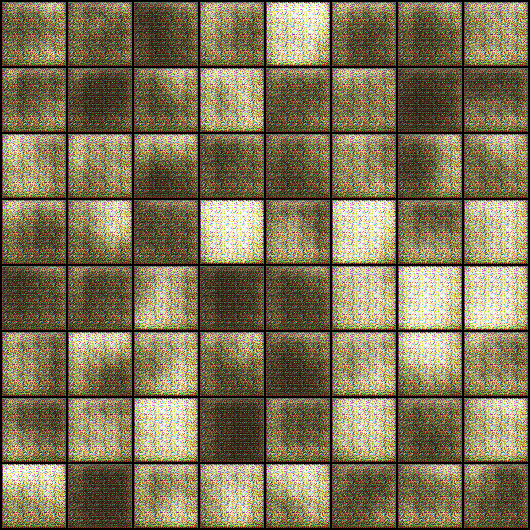

In [ ]:
Image('./generated/generated-images-0001.png')

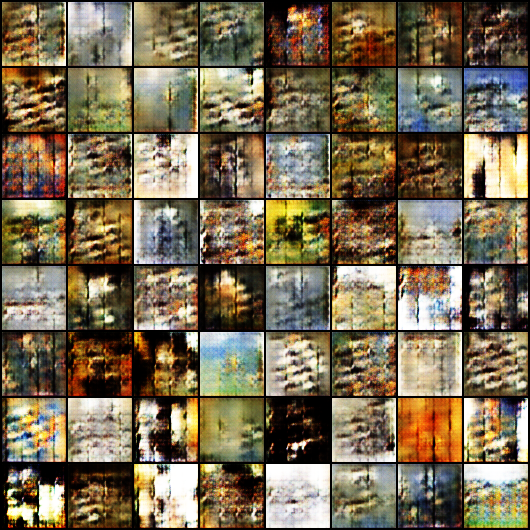

In [ ]:
Image('./generated/generated-images-0031.png')

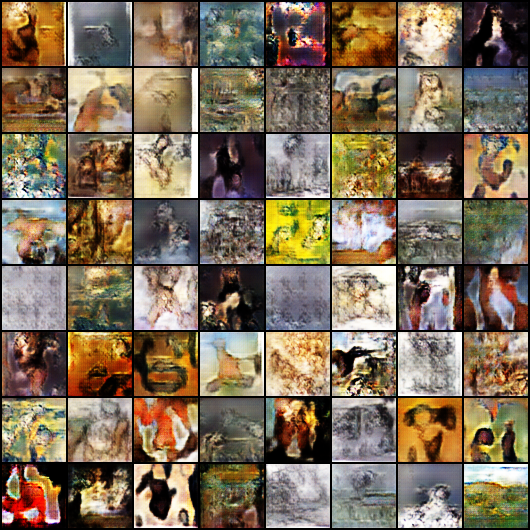

In [ ]:
Image('./generated/generated-images-0090.png')

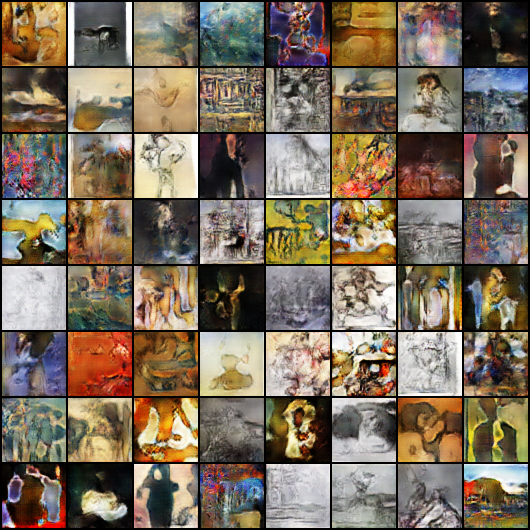

In [ ]:
Image('./generated/generated-images-0141.png')

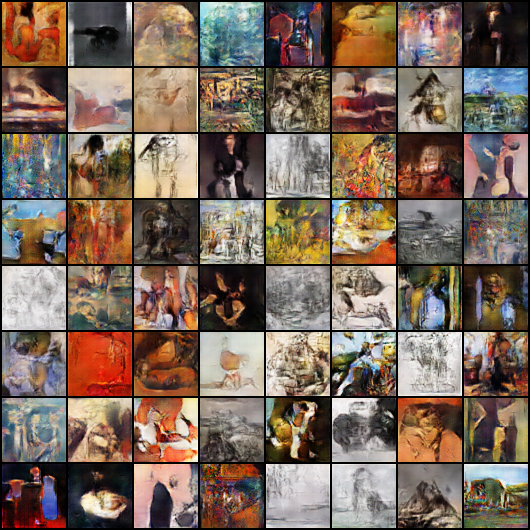

In [ ]:
Image('./generated/generated-images-0201.png')

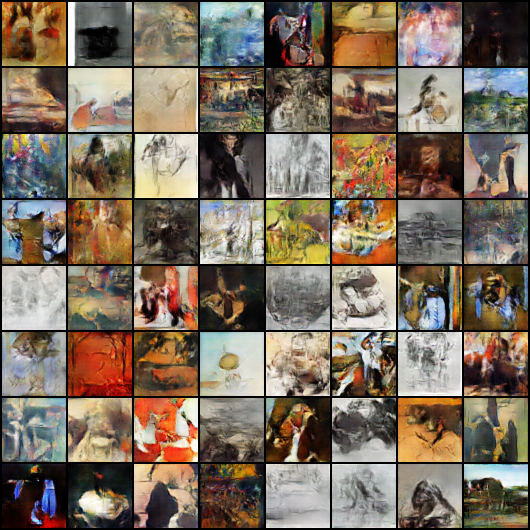

In [ ]:
Image('./generated/generated-images-0241.png')

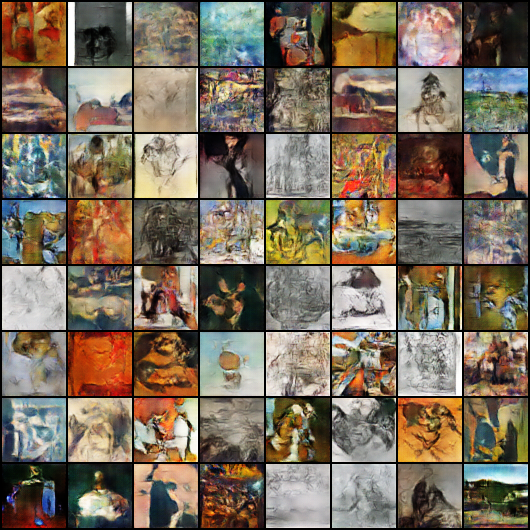

In [ ]:
Image('./generated/generated-images-0281.png')

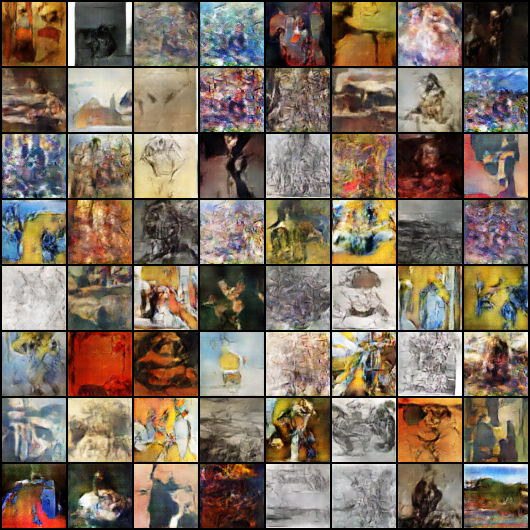

In [ ]:
Image('./generated/generated-images-0300.png')

In [ ]:
import cv2
import os

vid_fname = 'art_gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 5, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

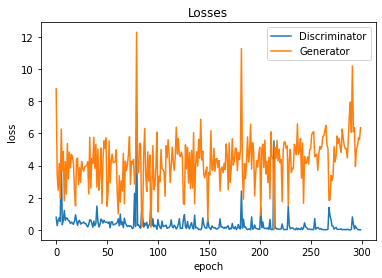

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

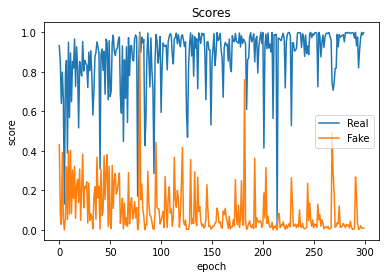

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');